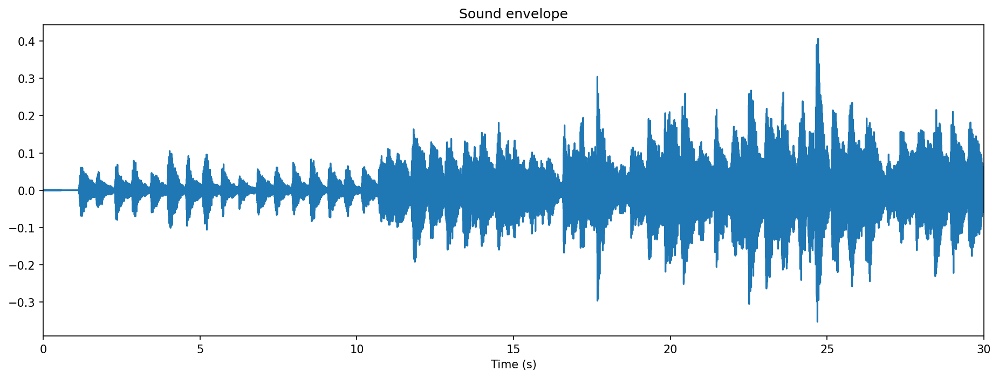

In [4]:
import matplotlib.pyplot as plt
import librosa
import librosa.display
import numpy as np
from IPython.display import Audio, display

import ruptures as rpt  # our package

def fig_ax(figsize=(15, 5), dpi=150):
    """Return a (matplotlib) figure and ax objects with given size."""
    return plt.subplots(figsize=figsize, dpi=dpi)

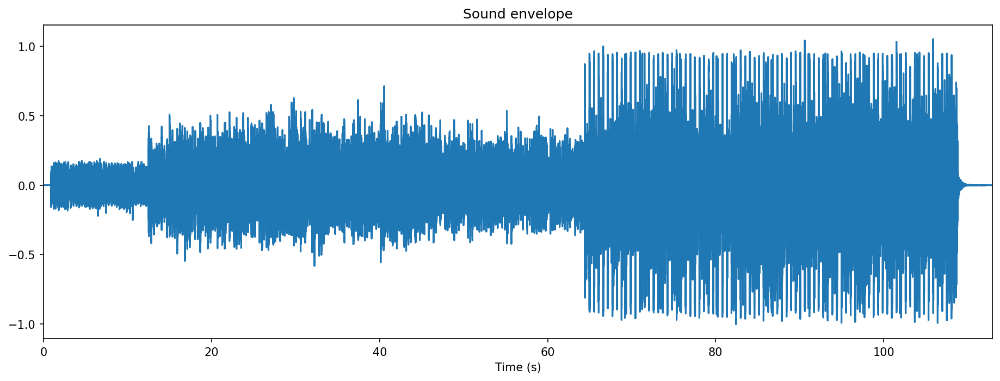

In [16]:
duration = 120  # in seconds
signal, sampling_rate = librosa.load(r"C:\Users\nield\Desktop\GitHub\Music-Structure-Analysis\DO NOT TOUCH\Audio Files\Emmanuel\01. Vitalic - Polkamatic.flac", duration=duration)

# listen to the music
display(Audio(data=signal, rate=sampling_rate))

# look at the envelope
fig, ax = fig_ax()
ax.plot(np.arange(signal.size) / sampling_rate, signal)
ax.set_xlim(0, signal.size / sampling_rate)
ax.set_xlabel("Time (s)")
_ = ax.set(title="Sound envelope")

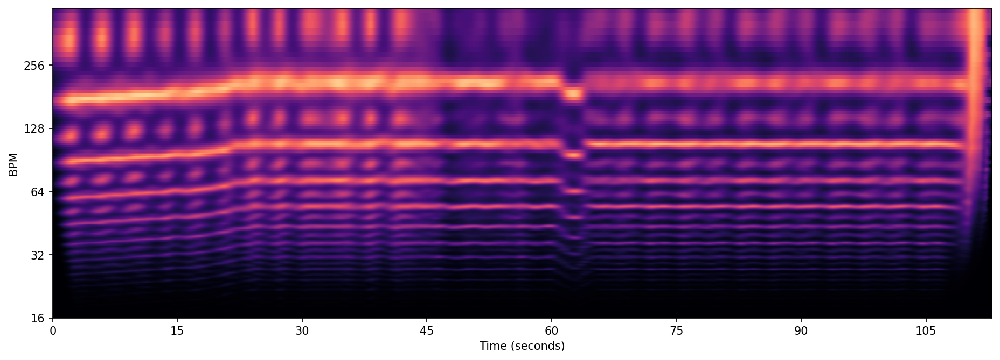

In [36]:
# Compute the onset strength
hop_length_tempo = 256
oenv = librosa.onset.onset_strength(
    y=signal, sr=sampling_rate, hop_length=hop_length_tempo
)
# Compute the tempogram
tempogram = librosa.feature.tempogram(
    onset_envelope=oenv,
    sr=sampling_rate,
    hop_length=hop_length_tempo,
)
# Display the tempogram
fig, ax = fig_ax()
_ = librosa.display.specshow(
    tempogram,
    ax=ax,
    hop_length=hop_length_tempo,
    sr=sampling_rate,
    x_axis="s",
    y_axis="tempo",
)

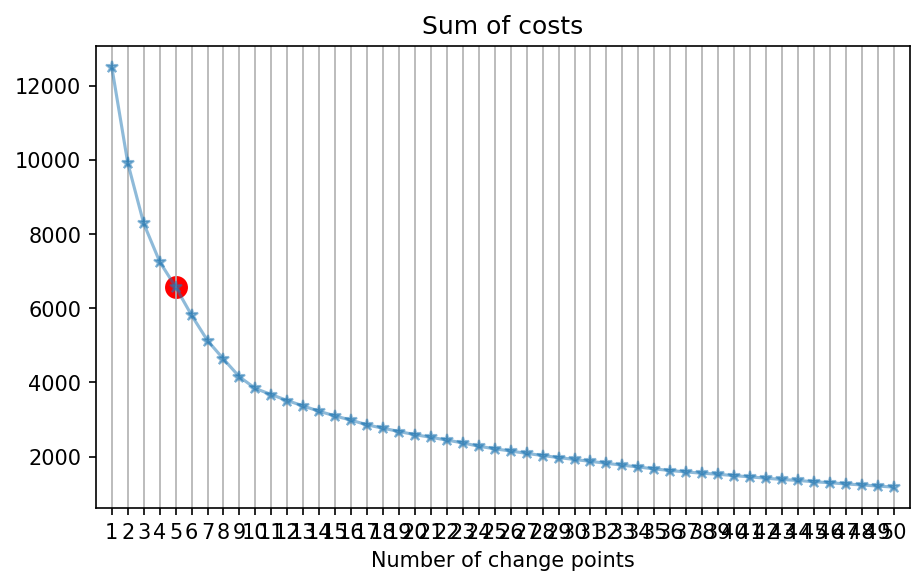

In [41]:
# Choose detection method
algo = rpt.KernelCPD(kernel="linear").fit(tempogram.T)

# Choose the number of changes (elbow heuristic)
n_bkps_max = 50  # K_max
# Start by computing the segmentation with most changes.
# After start, all segmentations with 1, 2,..., K_max-1 changes are also available for free.
_ = algo.predict(n_bkps_max)

array_of_n_bkps = np.arange(1, n_bkps_max + 1)


def get_sum_of_cost(algo, n_bkps) -> float:
    """Return the sum of costs for the change points `bkps`"""
    bkps = algo.predict(n_bkps=n_bkps)
    return algo.cost.sum_of_costs(bkps)


fig, ax = fig_ax((7, 4))
ax.plot(
    array_of_n_bkps,
    [get_sum_of_cost(algo=algo, n_bkps=n_bkps) for n_bkps in array_of_n_bkps],
    "-*",
    alpha=0.5,
)
ax.set_xticks(array_of_n_bkps)
ax.set_xlabel("Number of change points")
ax.set_title("Sum of costs")
ax.grid(axis="x")
ax.set_xlim(0, n_bkps_max + 1)

# Visually we choose n_bkps=5 (highlighted in red on the elbow plot)
n_bkps = 5
_ = ax.scatter([5], [get_sum_of_cost(algo=algo, n_bkps=5)], color="r", s=100)

Vertical line at: 1.60 seconds
Vertical line at: 10.84 seconds
Vertical line at: 21.15 seconds
Vertical line at: 45.80 seconds
Vertical line at: 109.30 seconds


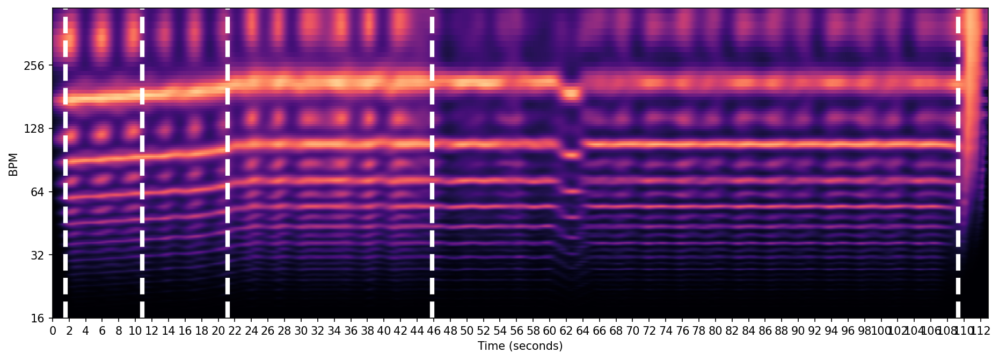

In [51]:
# Segmentation
bkps = algo.predict(n_bkps=n_bkps)
# Convert the estimated change points (frame counts) to actual timestamps
bkps_times = librosa.frames_to_time(bkps, sr=sampling_rate, hop_length=hop_length_tempo)

# Displaying results
fig, ax = fig_ax()
_ = librosa.display.specshow(
    tempogram,
    ax=ax,
    x_axis="s",
    y_axis="tempo",
    hop_length=hop_length_tempo,
    sr=sampling_rate,
)

time_max = tempogram.shape[1] * hop_length_tempo / sampling_rate
tick_step = max(1, int(time_max // 50))  # Adjust step dynamically for readability

ax.set_xticks(np.arange(0, time_max, step=tick_step))
ax.set_xticklabels(np.arange(0, time_max, step=tick_step, dtype=int))

for b in bkps_times[:-1]:
    ax.axvline(b, ls="--", color="white", lw=4)
    print(f"Vertical line at: {b:.2f} seconds")


In [52]:
# Compute change points corresponding indexes in original signal
bkps_time_indexes = (sampling_rate * bkps_times).astype(int).tolist()

for segment_number, (start, end) in enumerate(
    rpt.utils.pairwise([0] + bkps_time_indexes), start=1
):
    segment = signal[start:end]
    print(f"Segment n°{segment_number} (duration: {segment.size/sampling_rate:.2f} s)")
    display(Audio(data=segment, rate=sampling_rate))

Segment n°1 (duration: 1.60 s)


Segment n°2 (duration: 9.24 s)


Segment n°3 (duration: 10.31 s)


Segment n°4 (duration: 24.65 s)


Segment n°5 (duration: 63.49 s)


Segment n°6 (duration: 3.65 s)
